In [1]:
import pandas as pd
import numpy as np
import scipy
import seaborn as sns
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors 
import warnings
import scanpy as sc
import anndata as ad
import xarray as xr

warnings.filterwarnings("ignore")

In [2]:
## Folders
WDIR_PATH="/beegfs/data/SchneiderLab/CODEX_processing/"
#run_folders_prefix="fusion_"
#run_folders_suffix="_Anna"
#in_data_dir_pattern = "/quantifications/"
intensities_file_prefix="test_"
#intensities_file_suffix="_asinh.csv"

zarr_dirs_pattern="pipeline_run/zarr/test_"

In [3]:
### runs
runs=['run21', 'run22', 'run23', 'run24']
## one condition_vec per run, named as the runs
condition_vecs={'run21':['d180', 'd0', 'd0', 'd60', 'd180'],
                'run22':['d365', 'd0', 'd60'],
                'run23':['d0', 'd365', 'd60', 'd100'],
                'run24':['d0', 'd270', 'd0', 'd365', 'd180']}
## working samples per run , named as the runs
working_samples={'run21':list(range(0, 5)),
                 'run22':list(range(0, 3)),
                 'run23':list(range(0, 4)),
                 'run24':list(range(0, 5))}


In [4]:
obs=pd.read_csv('./seurat_object_harmony_clusts_filt_meta_bg.csv', index_col=0)
#counts=scipy.io.mmread('./seurat_object_harmony_clusts_filt_bg_id_counts.mtx', spmatrix=True)
counts=scipy.io.mmread('./seurat_object_harmony_clusts_filt_bg_id_counts.mtx')

In [5]:
mk_names=pd.read_csv('./seurat_object_harmony_clusts_filt_bg_id_mk_names.csv', index_col=0)

In [6]:
anndata=ad.AnnData(pd.DataFrame(counts.T.todense(), columns=mk_names.x))
anndata.obs_names=obs.index

In [7]:
#### select resolution
#obs.seurat_clusters=obs['SCT_snn_res.0.4']
obs.seurat_clusters=obs['SCT_snn_res.0.3']

In [8]:
"""
0: Myeloid cells (mono/macro/granulo)​

1: SMA+ stromal cells -> gradually decrease along time​ -> SMA+_activated_stroma

2: SMA- stromal cells​ -> Perivascular_niche

3: Red blood cells and B cells​ -> Erythroid_lymphoid_niche

4: Collagen 1 high niche -> increase at late timepoints​ -> Periosteal_niche

5: Nes+ stromal cells​ -> Pericytes

6: MK/MK progenitors​ -> Megakaryocytic_niche

7: Artifact or bone lining cells​
"""

'\n0: Myeloid cells (mono/macro/granulo)\u200b\n\n1: SMA+ stromal cells -> gradually decrease along time\u200b -> SMA+_activated_stroma\n\n2: SMA- stromal cells\u200b -> Perivascular_niche\n\n3: Red blood cells and B cells\u200b -> Erythroid_lymphoid_niche\n\n4: Collagen 1 high niche -> increase at late timepoints\u200b -> Periosteal_niche\n\n5: Nes+ stromal cells\u200b -> Pericytes\n\n6: MK/MK progenitors\u200b -> Megakaryocytic_niche\n\n7: Artifact or bone lining cells\u200b\n'

In [9]:
#### remove artifact clusters

obs=obs[[i not in [7] for i in obs.seurat_clusters]]
#### annotation
obs.seurat_clusters[obs.seurat_clusters==0]='Myeloid_niche'
obs.seurat_clusters[obs.seurat_clusters==1]='SMA+_activated_stroma'
obs.seurat_clusters[obs.seurat_clusters==2]='Perivascular_niche'
obs.seurat_clusters[obs.seurat_clusters==3]='Erythroid_lymphoid_niche'
obs.seurat_clusters[obs.seurat_clusters==4]='Periosteal_niche'
obs.seurat_clusters[obs.seurat_clusters==5]='Pericytes'
obs.seurat_clusters[obs.seurat_clusters==6]='Megakaryocytic_niche'

## Keep cluster 0 subclusters from resolution 0.5
#obs.seurat_clusters[obs['SCT_snn_res.0.5']==3]='neutrophils_stromal_2'
#obs.seurat_clusters[obs['SCT_snn_res.0.5']==9]='neutrophils_stromal_3'


In [10]:
## clusters as categorical
obs.seurat_clusters=obs.seurat_clusters.astype('category')
obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,condition,sample,run,nCount_SCT,nFeature_SCT,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.1,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5
0_run21_d180_1,CODEX_fusion_run21-24,32.891156,21,d180,run21_d180_1,run21,14,10,1,SMA+_activated_stroma,0,1,1,1
1_run21_d180_1,CODEX_fusion_run21-24,29.335893,20,d180,run21_d180_1,run21,12,9,1,SMA+_activated_stroma,0,1,5,12
2_run21_d180_1,CODEX_fusion_run21-24,27.589068,21,d180,run21_d180_1,run21,12,9,0,Megakaryocytic_niche,0,6,5,12
3_run21_d180_1,CODEX_fusion_run21-24,9.926144,10,d180,run21_d180_1,run21,10,6,4,Periosteal_niche,0,4,2,3
6_run21_d180_1,CODEX_fusion_run21-24,17.869942,18,d180,run21_d180_1,run21,11,8,0,Megakaryocytic_niche,0,6,5,0


In [11]:
#dat = { f.split('/')[-1].split('.')[0]: xr.open_zarr(f) for f in glob(WDIR_PATH+zarr_dirs_pattern+'run62'+"*.zarr") }

In [12]:
#list(dat.keys())

In [13]:
#### Get coordinates
sp_coords=pd.DataFrame()
for run in runs:
    #dat = { f.split('/')[-1].split('.')[0]: xr.open_zarr(f) for f in glob(WDIR_PATH+run_folders_prefix+run+run_folders_suffix+zarr_dirs_pattern+"*.zarr") }
    dat = { f.split('/')[-1].split('.')[0]: xr.open_zarr(f) for f in glob(WDIR_PATH+zarr_dirs_pattern+run+"*.zarr") }
    channels=list(dat[list(dat.keys())[0]].channels.to_dataframe().index)
    condition_vec=condition_vecs[run]

    adatas = []
    for i in working_samples[run]:
        print(i)
    
        adata=ad.AnnData(pd.DataFrame(dat[intensities_file_prefix+run+'_'+str(i+1)]._intensity, columns=channels).iloc[:,1:len(channels)])
        #adata=ad.AnnData(pd.DataFrame(dat[list(dat.keys())[i]]._intensity, columns=channels).iloc[:,1:len(channels)])
        #sp=pd.DataFrame(dat[intensities_file_prefix+str(i+1)]._obs).loc[:,1:2]
        sp=pd.DataFrame(dat[intensities_file_prefix+run+'_'+str(i+1)]._obs).iloc[:,-2:] ## last 2 columns
        #sp=pd.DataFrame(dat[list(dat.keys())[i]]._obs).iloc[:,-2:] ## last 2 columns
        #sp.columns=['x', 'y']
        sp.columns=['0', '1']
        sp.index=adata.obs.index
        adata.obsm['spatial']=sp.to_numpy()
        
        print(adata.obs.shape)
        
        adata.obs_names=[n+'_'+run+'_'+condition_vec[i]+'_'+str(i+1) for n in adata.obs_names]
        
        adata=adata[obs.index[obs['sample']==run+'_'+condition_vec[i]+'_'+str(i+1)]]
        adatas.append(adata)

    ad_run=ad.concat(adatas)
    sp_coords=pd.concat([sp_coords, pd.DataFrame(ad_run.obsm['spatial'])])
sp_coords.index=obs.index

0
(43945, 0)
1
(50480, 0)
2
(74643, 0)
3
(205488, 0)
4
(145713, 0)
0
(77434, 0)
1
(58675, 0)
2
(25123, 0)
0
(39197, 0)
1
(102507, 0)
2
(7808, 0)
3
(20067, 0)
0
(110665, 0)
1
(55126, 0)
2
(217589, 0)
3
(56102, 0)
4
(36434, 0)


In [14]:
anndata=anndata[obs.index]

In [15]:
obs['SCT_snn_res.0.1']=obs['SCT_snn_res.0.1'].astype('category')
obs['SCT_snn_res.0.2']=obs['SCT_snn_res.0.2'].astype('category')
obs['SCT_snn_res.0.3']=obs['SCT_snn_res.0.3'].astype('category')
obs['SCT_snn_res.0.4']=obs['SCT_snn_res.0.4'].astype('category')
obs['SCT_snn_res.0.5']=obs['SCT_snn_res.0.5'].astype('category')

In [16]:
anndata.obs=obs

In [17]:
anndata.obsm['spatial']=sp_coords[[0,1]].to_numpy()

In [18]:
anndata.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,condition,sample,run,nCount_SCT,nFeature_SCT,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.1,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5
0_run21_d180_1,CODEX_fusion_run21-24,32.891156,21,d180,run21_d180_1,run21,14,10,1,SMA+_activated_stroma,0,1,1,1
1_run21_d180_1,CODEX_fusion_run21-24,29.335893,20,d180,run21_d180_1,run21,12,9,1,SMA+_activated_stroma,0,1,5,12
2_run21_d180_1,CODEX_fusion_run21-24,27.589068,21,d180,run21_d180_1,run21,12,9,0,Megakaryocytic_niche,0,6,5,12
3_run21_d180_1,CODEX_fusion_run21-24,9.926144,10,d180,run21_d180_1,run21,10,6,4,Periosteal_niche,0,4,2,3
6_run21_d180_1,CODEX_fusion_run21-24,17.869942,18,d180,run21_d180_1,run21,11,8,0,Megakaryocytic_niche,0,6,5,0


In [19]:
anndata.obs['sample'].unique()

array(['run21_d180_1', 'run21_d0_2', 'run21_d0_3', 'run21_d60_4',
       'run21_d180_5', 'run22_d365_1', 'run22_d0_2', 'run22_d60_3',
       'run23_d0_1', 'run23_d365_2', 'run23_d60_3', 'run23_d100_4',
       'run24_d0_1', 'run24_d270_2', 'run24_d0_3', 'run24_d365_4',
       'run24_d180_5'], dtype=object)

In [20]:
anndata.var_names

Index(['X011.SMA', 'X013.Ki.67', 'X009.CD11b', 'X016.Nestin', 'X055.CD36',
       'X052.CD16', 'X006.Collagen.IV.human', 'X024.CD20', 'X079.S100B',
       'X026.CD68', 'X025.CD34.human', 'X074.PF4', 'X010.CD14', 'X127.CD61',
       'X072.Perilipin', 'X123.IDO1', 'X015.Vimentin', 'X132.Interferon.gamma',
       'X004.Gycophorin.A', 'X122.CD38', 'X051.CD146', 'X077.S100A4',
       'X019.Collagen.1', 'X126.S100A8.9', 'X084.CD56..NCam1.',
       'X006.HLA.DR.CD74', 'X103.CXCL12', 'X001.CD31'],
      dtype='object', name='x')

In [21]:
####
import numpy as np
from scipy.spatial import KDTree

ad=anndata[anndata.obs['sample']=='run21_d0_2']

# 1. Define your parameters
radius_threshold = 20

# 2. Get coordinates and build tree
coords = ad.obsm['spatial']
tree = KDTree(coords)

# 3. Find neighbors within the radius for every cell
# query_ball_point returns a list of neighbor indices for each point
neighbor_indices = tree.query_ball_point(coords, r=radius_threshold)
# 4. Count neighbors (subtract 1 because the cell itself is included)
ad.obs['n_spatial_neighbors'] = [len(inds) - 1 for inds in neighbor_indices]


In [22]:
import numpy as np
from matplotlib.path import Path
ad=anndata[anndata.obs['sample']=='run21_d0_2']
# 1. Define your ROI coordinates (vertices of the polygon)
# Format: [[x1, y1], [x2, y2], [x3, y3], ...]
#roi_vertices = np.array([
#    [18000, 30000], 
#    [6000, 30000],
#    [6000, 000], 
#    [18000, 000]
#])

roi_vertices = np.array([
    [22000, 17000], #right top
    [8000, 212000], #left top
    [5500, 100],  #left bottom
    [8000, 000] #right bottom
])

# 2. Create a Path object
roi_path = Path(roi_vertices)

# 3. Check which cells are inside the polygon
coords = ad.obsm['spatial']

# Re-generate the mask (e.g., using the Polygon Path from before)
is_inside = roi_path.contains_points(coords)


# 4. Subset the AnnData object
ad[is_inside].copy()

AnnData object with n_obs × n_vars = 41349 × 28
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'sample', 'run', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.2', 'seurat_clusters', 'SCT_snn_res.0.1', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5'
    obsm: 'spatial'

In [23]:
pd.DataFrame(ad.obsm['spatial'])[0].min()

1289.773764258555

In [24]:
pd.DataFrame(ad.obsm['spatial'])[0].max()

17369.897556076332

In [25]:
pd.DataFrame(ad.obsm['spatial'])[1].max()

21481.493661446682

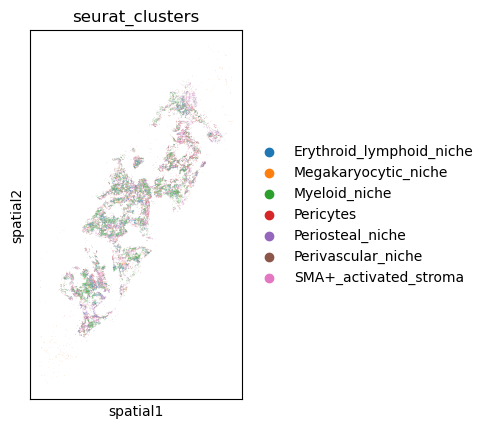

In [26]:
sc.pl.spatial(ad[is_inside], color='seurat_clusters', spot_size = 20, use_raw=False,img_key=None, show=False)
#sc.pl.spatial(ad[is_inside], color='seurat_clusters', spot_size = 20, use_raw=False)
ax = plt.gca()
ax.invert_yaxis()
plt.savefig('./figures/test.pdf',bbox_inches='tight')

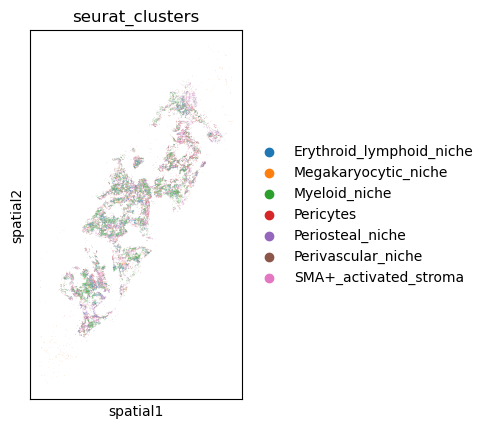

In [27]:
sc.pl.spatial(ad[is_inside], color='seurat_clusters', spot_size = 20, use_raw=False,img_key=None, show=False)
#sc.pl.spatial(ad[is_inside], color='seurat_clusters', spot_size = 20, use_raw=False)
ax = plt.gca()
ax.invert_yaxis()
plt.savefig('./figures/test.pdf',bbox_inches='tight')

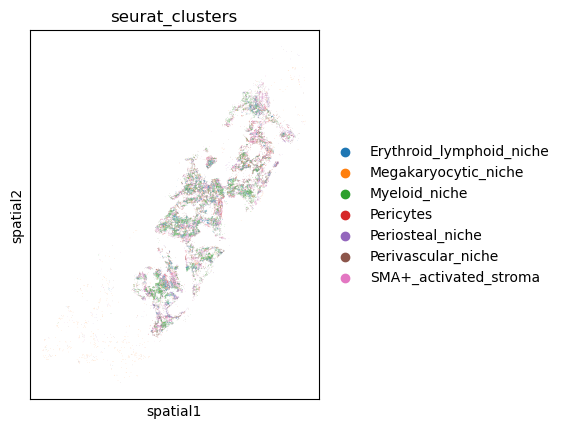

In [28]:
sc.pl.spatial(ad, color='seurat_clusters', spot_size = 20, use_raw=False,img_key=None, show=False)
#sc.pl.spatial(ad, color='seurat_clusters', spot_size = 20, use_raw=False)
ax = plt.gca()
ax.invert_yaxis()

In [29]:
ad.uns['seurat_clusters_colors']

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

In [30]:
clist=ad.uns['seurat_clusters_colors']

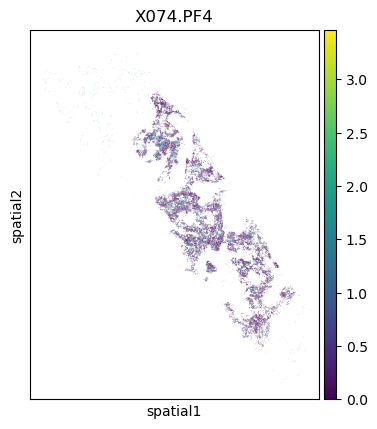

In [31]:
sc.pl.spatial(ad, color='X074.PF4', spot_size = 20, use_raw=False)

In [32]:
sampleTypesDF=anndata.obs[['sample', 'condition']].drop_duplicates()
sampleTypesDF.columns=['sample', 'sampleType']
sampleTypesDF.index=sampleTypesDF['sample']
sampleTypesDF

,sample,sampleType
sample,,
run21_d180_1,run21_d180_1,d180
run21_d0_2,run21_d0_2,d0
run21_d0_3,run21_d0_3,d0
run21_d60_4,run21_d60_4,d60
run21_d180_5,run21_d180_5,d180
run22_d365_1,run22_d365_1,d365
run22_d0_2,run22_d0_2,d0
run22_d60_3,run22_d60_3,d60
run23_d0_1,run23_d0_1,d0


In [33]:
######################################################

In [34]:
anndata.obs['clusters_named']=anndata.obs['seurat_clusters']

In [35]:
anndata.obs['clusters_named']=anndata.obs.clusters_named.astype('category')
anndata.obs.clusters_named.cat.categories

Index(['Erythroid_lymphoid_niche', 'Megakaryocytic_niche', 'Myeloid_niche',
       'Pericytes', 'Periosteal_niche', 'Perivascular_niche',
       'SMA+_activated_stroma'],
      dtype='object')

In [36]:
anndata.uns['clusters_named_colors']=clist

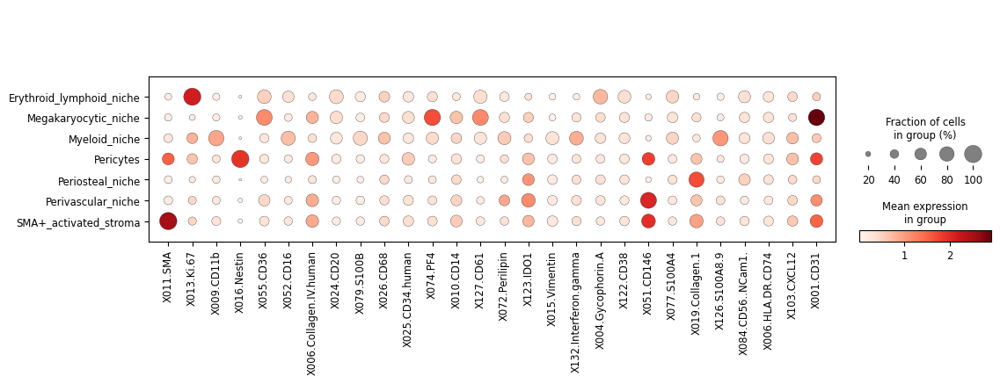

In [37]:
sc.pl.dotplot(anndata, anndata.var_names, groupby='clusters_named', save='_scpy_allMarkers_r0.3.pdf')

In [38]:
ad2=sc.read_h5ad('seurat_object_harmony_clusts_filt_bg_id.h5ad')
ad2=ad2[[i not in ['7'] for i in ad2.obs['SCT_snn_res.0.3']]]
#anndata.obsm=ad2.obsm
anndata.obsm['X_harmony']=ad2.obsm['X_harmony']
anndata.obsm['X_pca']=ad2.obsm['X_pca']
anndata.obsm['X_umap']=ad2.obsm['X_umap']
#'X_harmony', 'X_pca', 'X_umap'
del ad2

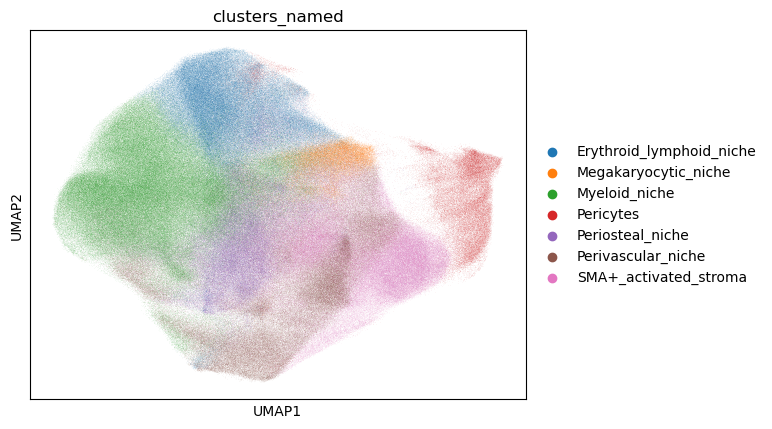

In [39]:
sc.pl.umap(anndata, color='clusters_named', save='_cluster_umap_ann.pdf')

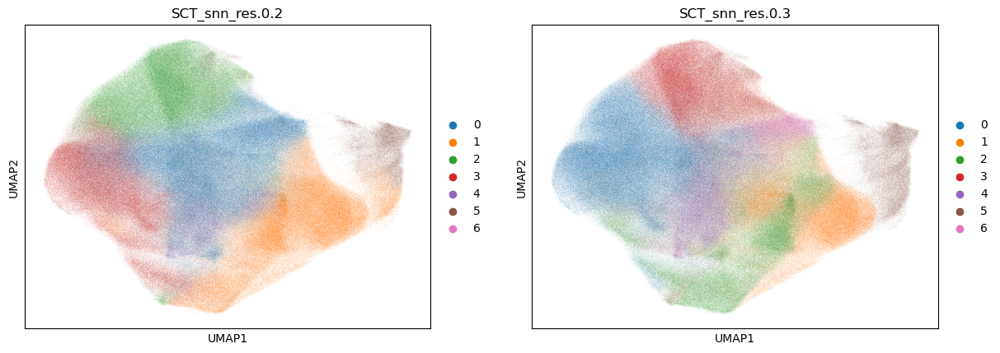

In [40]:
sc.pl.umap(anndata, color=['SCT_snn_res.0.2','SCT_snn_res.0.3'], save='_cluster_umap_multi_1.pdf')

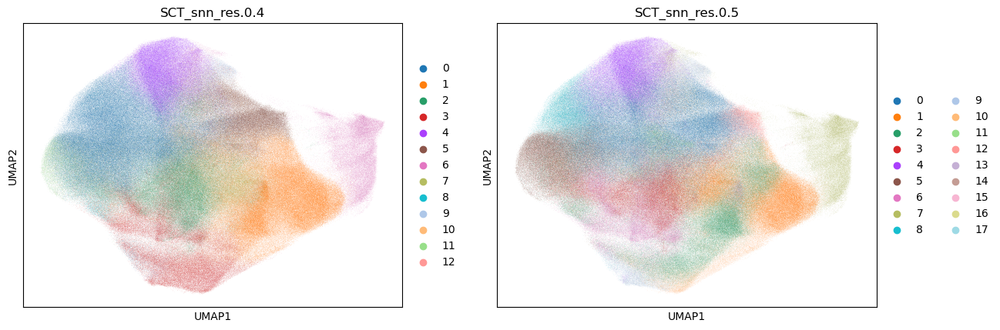

In [41]:
sc.pl.umap(anndata, color=['SCT_snn_res.0.4', 'SCT_snn_res.0.5'], save='_cluster_umap_multi_2.pdf')

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

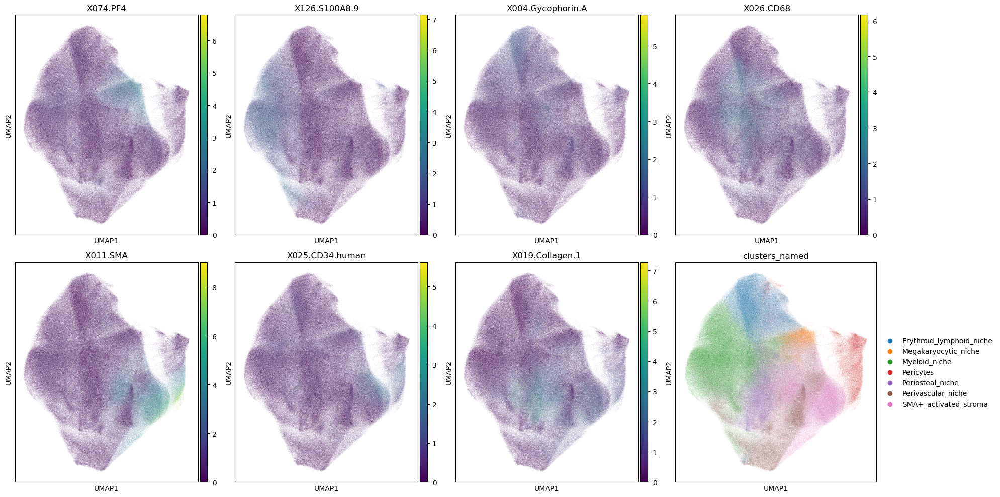

In [42]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
plt.close(fig)
for idu,mkr in enumerate(['X074.PF4', 'X126.S100A8.9', 'X004.Gycophorin.A', 'X026.CD68']):
    sc.pl.umap(anndata, color=mkr, ax=axes[0][idu])

for idu,mkr in enumerate(['X011.SMA', 'X025.CD34.human', 'X019.Collagen.1', 'clusters_named']):
    sc.pl.umap(anndata, color=mkr, ax=axes[1][idu])

fig.tight_layout()
fig

In [43]:
fig.savefig('./figures/mks_in_umap.png', dpi=300)

In [44]:
sampleTypesDF

,sample,sampleType
sample,,
run21_d180_1,run21_d180_1,d180
run21_d0_2,run21_d0_2,d0
run21_d0_3,run21_d0_3,d0
run21_d60_4,run21_d60_4,d60
run21_d180_5,run21_d180_5,d180
run22_d365_1,run22_d365_1,d365
run22_d0_2,run22_d0_2,d0
run22_d60_3,run22_d60_3,d60
run23_d0_1,run23_d0_1,d0


In [45]:
#fig, axes = plt.subplots(2, 4, figsize=(20, 5))
#plt.close(fig)
#for idu,smpl in enumerate(list(anndata.obs['sample'][anndata.obs.condition=='WT'].unique())):
#    ad=anndata[anndata.obs['sample']==smpl].copy()
#    sc.pl.spatial(ad, color='clusters_named', spot_size = 20, use_raw=False, ax=axes[0][idu])

In [46]:
#for idu,smpl in enumerate(list(anndata.obs['sample'][anndata.obs.condition=='KO'].unique())):
#    ad=anndata[anndata.obs['sample']==smpl].copy()
#    sc.pl.spatial(ad, color='clusters_named', spot_size = 20, use_raw=False, ax=axes[1][idu])

In [47]:
#fig.tight_layout()
#fig

In [48]:
#fig.savefig('./figures/clusters_in_slices_spleen.png', dpi=900)

In [49]:
anndata.obs['grouping_1']='Post_allo'
anndata.obs['grouping_1'][anndata.obs['condition']=='d0']='Pre_allo'
anndata.obs['grouping_1']=anndata.obs['grouping_1'].astype('category')

anndata.obs['grouping_2']='Post_allo_early'
anndata.obs['grouping_2'][anndata.obs['condition']=='d0']='Pre_allo'
anndata.obs['grouping_2'][anndata.obs['condition']=='d365']='Post_allo_late'
anndata.obs['grouping_2']=anndata.obs['grouping_2'].astype('category')

<Axes: xlabel='sample'>

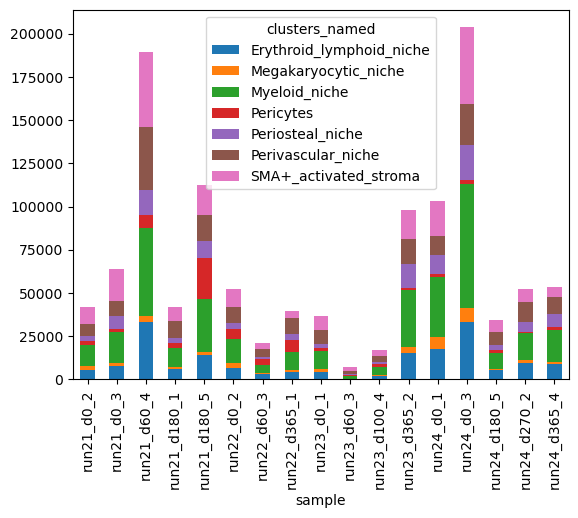

In [50]:
clusts_in_smpls=anndata.obs.groupby(['sample', 'clusters_named']).size().unstack()
clust_cols=pd.Series(clist, index=clusts_in_smpls.columns)
clusts_in_smpls.plot.bar(stacked=True, color=clust_cols)

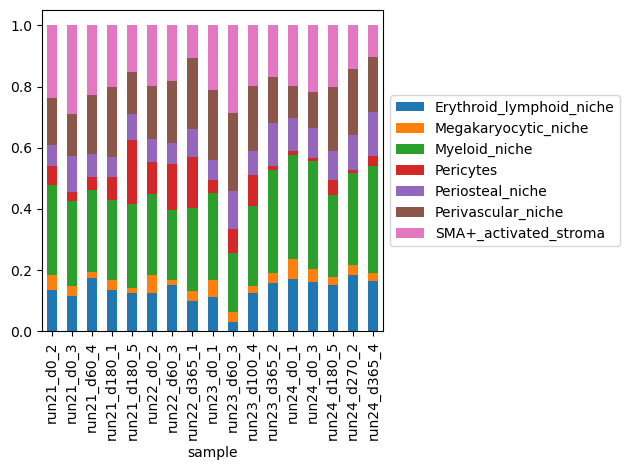

In [51]:
clusts_in_smpls_norm=clusts_in_smpls.T/clusts_in_smpls.T.sum()
clusts_in_smpls_norm.T.plot.bar(stacked=True, color=clust_cols)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout()
plt.savefig('./figures/clusts_in_samples_r0.3.pdf')

<Axes: xlabel='condition'>

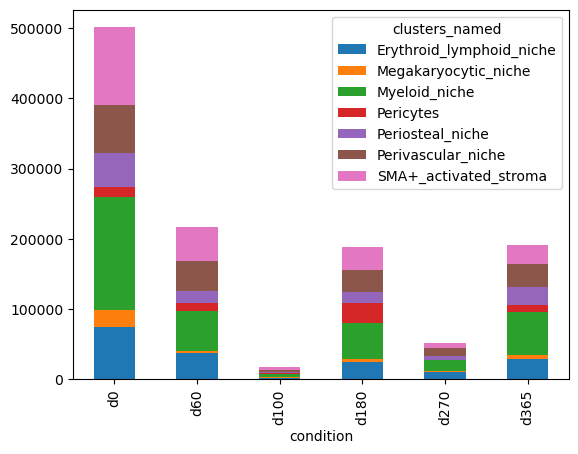

In [52]:
clusts_in_smpls=anndata.obs.groupby(['condition', 'clusters_named']).size().unstack()
clust_cols=pd.Series(clist, index=clusts_in_smpls.columns)
clusts_in_smpls.plot.bar(stacked=True, color=clust_cols)

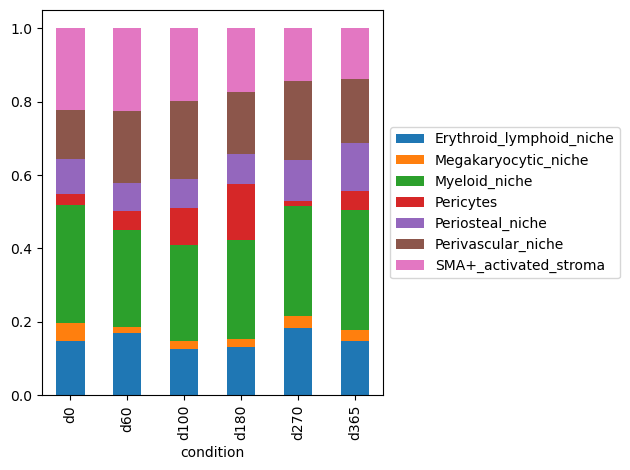

In [53]:
clusts_in_smpls_norm=clusts_in_smpls.T/clusts_in_smpls.T.sum()
clusts_in_smpls_norm.T.plot.bar(stacked=True, color=clust_cols)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout()
plt.savefig('./figures/clusts_in_conditions_r0.3.pdf')

<Axes: xlabel='grouping_1'>

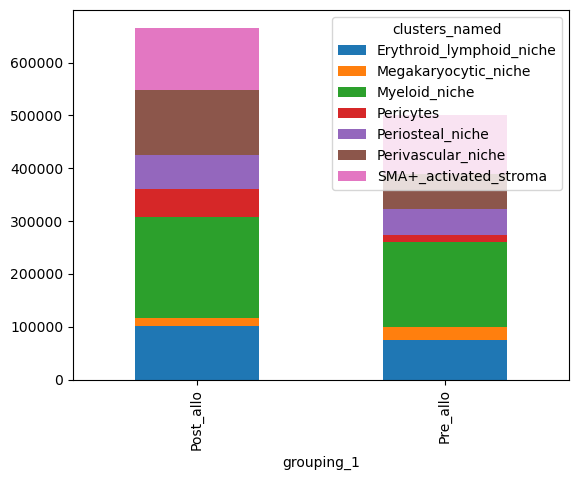

In [54]:
clusts_in_smpls=anndata.obs.groupby(['grouping_1', 'clusters_named']).size().unstack()
clust_cols=pd.Series(clist, index=clusts_in_smpls.columns)
clusts_in_smpls.plot.bar(stacked=True, color=clust_cols)

In [55]:
#clusts_in_smpls_norm[['Pre_allo', 'Post_allo']]

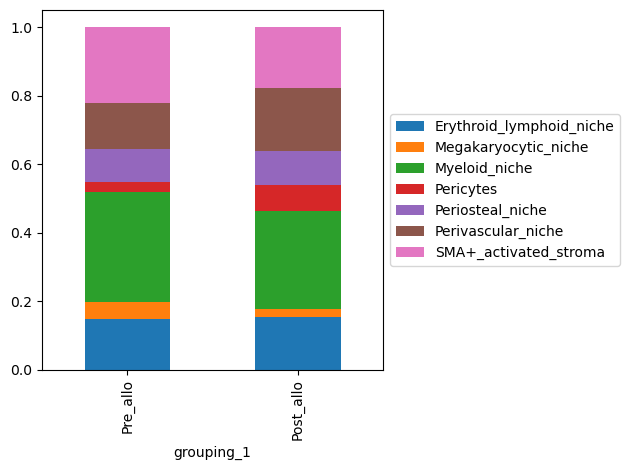

In [56]:
#from pandas.api.types import CategoricalDtype
#cat_type = CategoricalDtype(categories=['Pre_allo', 'Post_allo'], ordered=True)

clusts_in_smpls_norm=clusts_in_smpls.T/clusts_in_smpls.T.sum()
clusts_in_smpls_norm=clusts_in_smpls_norm[['Pre_allo', 'Post_allo']]
clusts_in_smpls_norm.columns=clusts_in_smpls_norm.columns.astype('category')
#clusts_in_smpls_norm.columns=clusts_in_smpls_norm.columns.reorder_categories(['Pre_allo', 'Post_allo'])
clusts_in_smpls_norm.T.plot.bar(stacked=True, color=clust_cols)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout()
plt.savefig('./figures/clusts_in_grouping_1_r0.3.pdf')

<Axes: xlabel='grouping_2'>

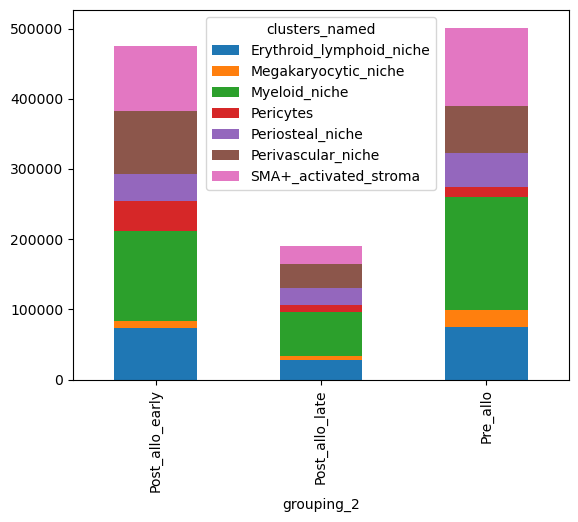

In [57]:
clusts_in_smpls=anndata.obs.groupby(['grouping_2', 'clusters_named']).size().unstack()
clust_cols=pd.Series(clist, index=clusts_in_smpls.columns)
clusts_in_smpls.plot.bar(stacked=True, color=clust_cols)

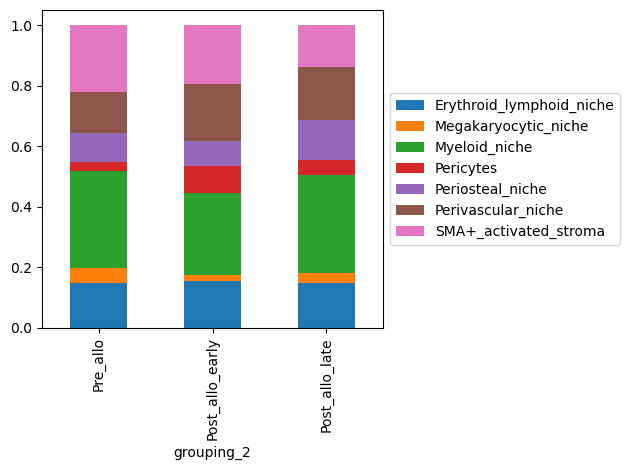

In [58]:
clusts_in_smpls_norm=clusts_in_smpls.T/clusts_in_smpls.T.sum()
clusts_in_smpls_norm=clusts_in_smpls_norm[['Pre_allo', 'Post_allo_early', 'Post_allo_late']]
clusts_in_smpls_norm.columns=clusts_in_smpls_norm.columns.astype('category')
#clusts_in_smpls_norm.columns=clusts_in_smpls_norm.columns.reorder_categories(['Pre_allo', 'Post_allo_early', 'Post_allo_late'])
clusts_in_smpls_norm.T.plot.bar(stacked=True, color=clust_cols)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout()
plt.savefig('./figures/clusts_in_grouping_2_r0.3.pdf')

In [59]:
#clusts_in_smpls_norm.columns=clusts_in_smpls_norm.columns.astype('category')
#clusts_in_smpls_norm.columns=clusts_in_smpls_norm.columns.reorder_categories(['WT', 'KO'])

In [60]:
anndata.obs['sample_reordered_name']=[x.split('_')[0]+'_'+x.split('_')[2]+'_'+x.split('_')[1] for x in anndata.obs['sample']]

In [61]:
anndata.obs['sample_reordered_name'].unique()

array(['run21_1_d180', 'run21_2_d0', 'run21_3_d0', 'run21_4_d60',
       'run21_5_d180', 'run22_1_d365', 'run22_2_d0', 'run22_3_d60',
       'run23_1_d0', 'run23_2_d365', 'run23_3_d60', 'run23_4_d100',
       'run24_1_d0', 'run24_2_d270', 'run24_3_d0', 'run24_4_d365',
       'run24_5_d180'], dtype=object)

In [62]:
anndata.obs.rename(columns={"Unnamed: 0": "cell_id", "nCount_RNA":"total_arcsinh_intensity_bgFilt", "nCount_SCT":"total_arcsinh_intensity_bgFilt_SCT",
                           "nFeature_RNA":"nFeature"}, inplace=True)

In [63]:
anndata.write_h5ad('./CODEX_run21-24_anndata.h5ad')

In [64]:
#anndata.write_h5ad('./CODEX_run45_anndata_final.h5ad')

In [65]:
#anndata.obs

## README

CODEX protein intensity data from **3 runs** (run27 - 29) , in total **13 samples** in **3 different conditions** , was stored in an anndata object: https://anndata.readthedocs.io/en/latest/tutorials/notebooks/getting-started.html 

The 'X' slot (anndata.X) contains normalized filtered intensities per protein per cell

The obsm['spatial'] slot (anndata.obsm['spatial']) contains the cells coordinates in each slice

The 'obs' slot contains information about each cell (rows) in each column:

    'arcsinh_intensity_bgFilt' = sum of arcsinh transformed protein intensities 
    
    'nFeature' = number of features detected before SCT transformation
    
    'arcsinh_intensity_bgFilt_SCT' = sum of SCT normalized arcsinh transformed protein intensities
    
    'nFeature_SCT' = number of features detected after SCT transformation
    
    'SCT_snn_res.0.2'= clusters at 0.2 resolution

    ...
    
    'SCT_snn_res.0.5' = clusters at 0.5 resolution
    
    'seurat_clusters' = annotated clusters at 0.4 resolution
    
    'clusters_named' = annotated clusters at 0.4 resolution
    

In [66]:
sc.set_figure_params(dpi=200, dpi_save=1000)

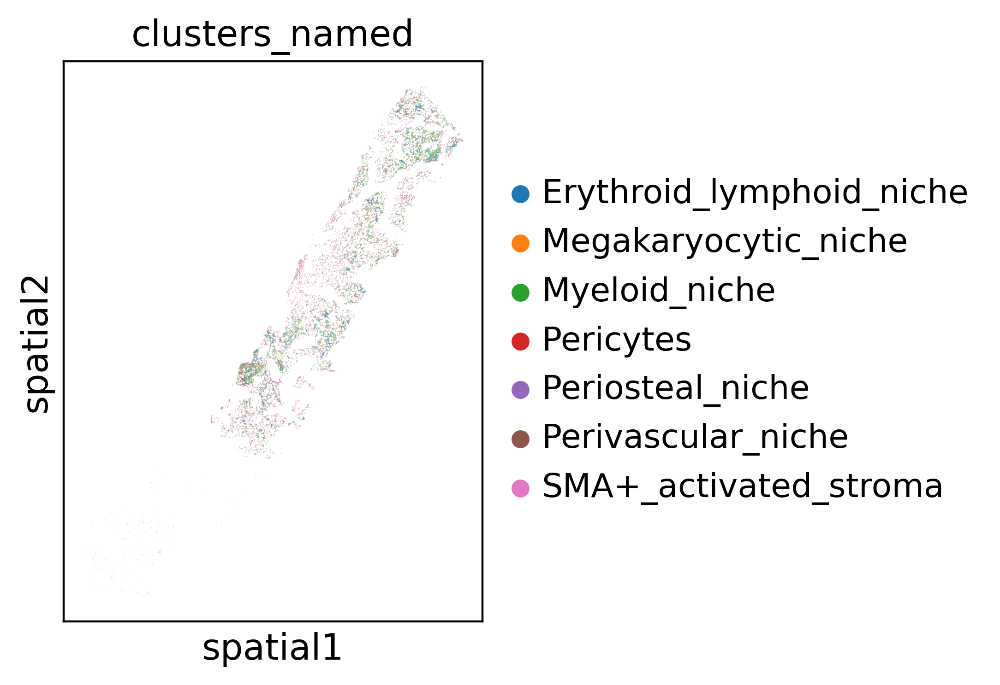

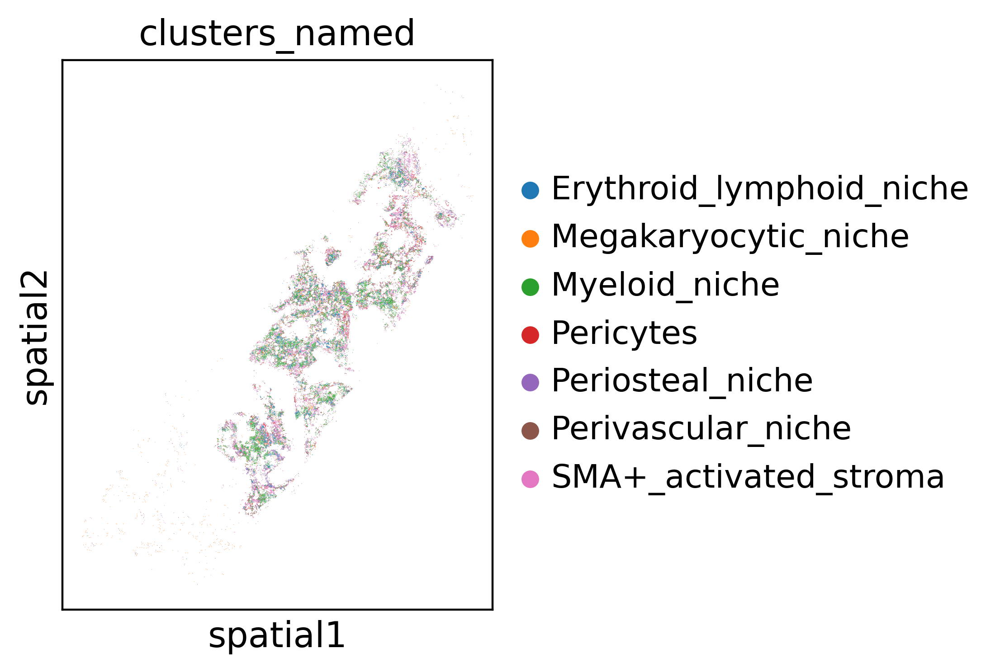

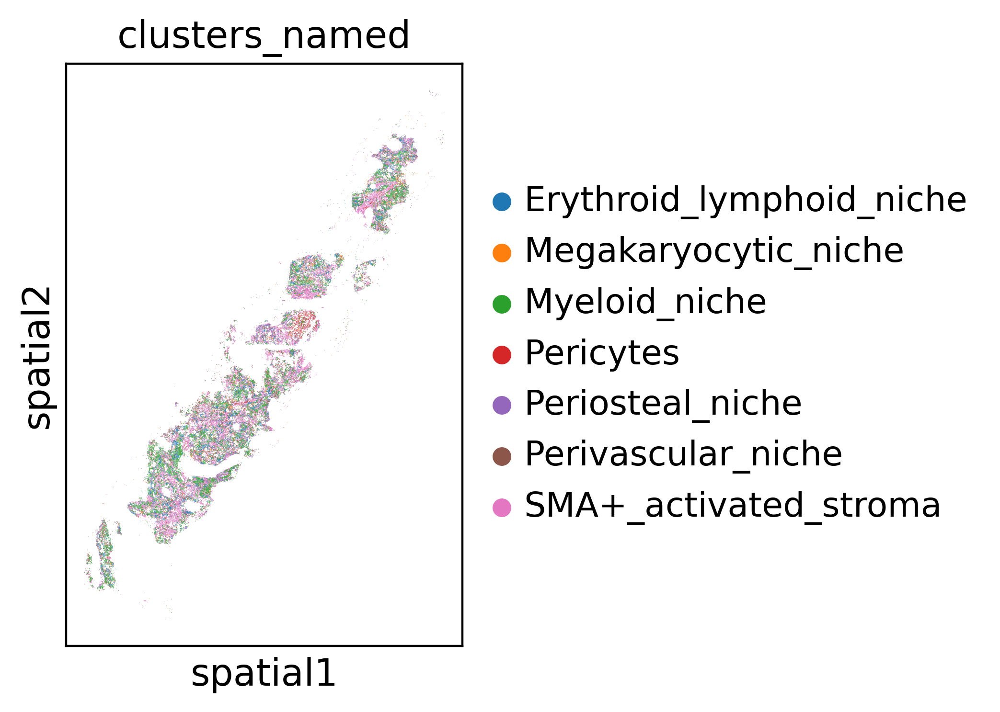

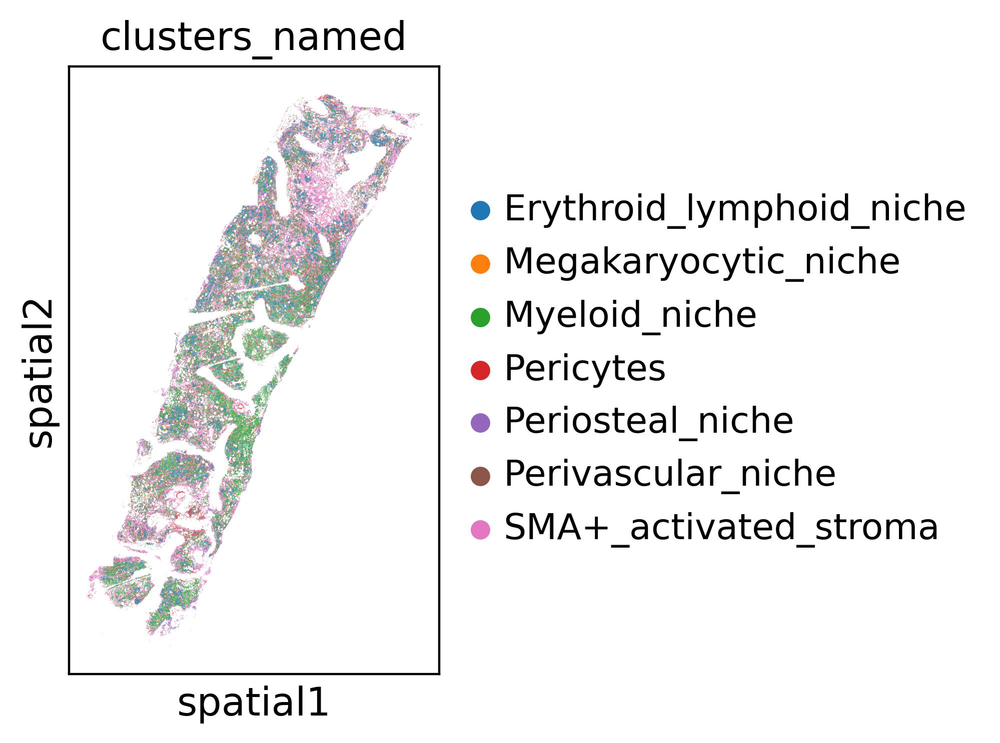

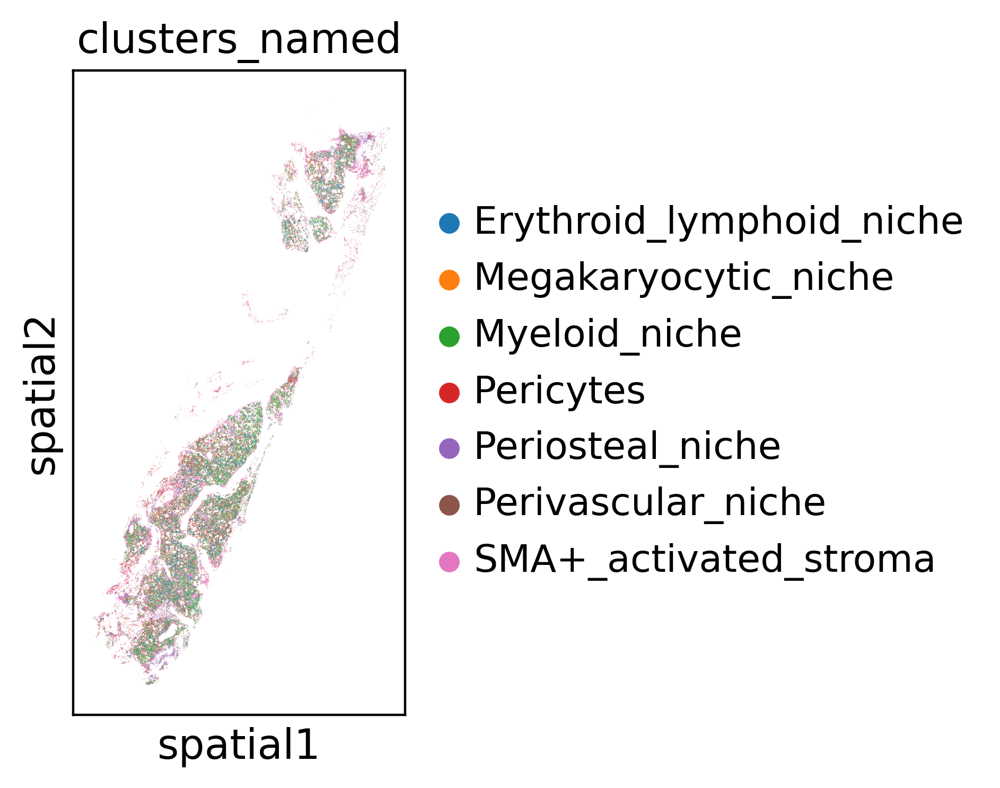

...

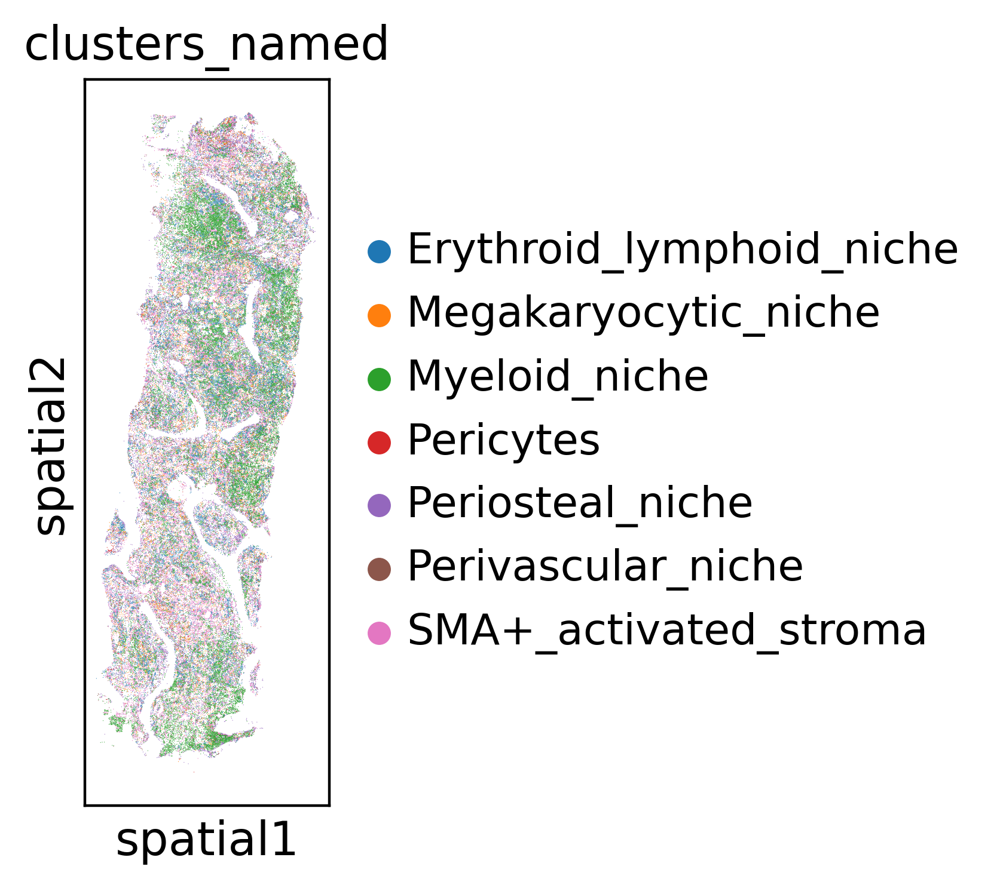

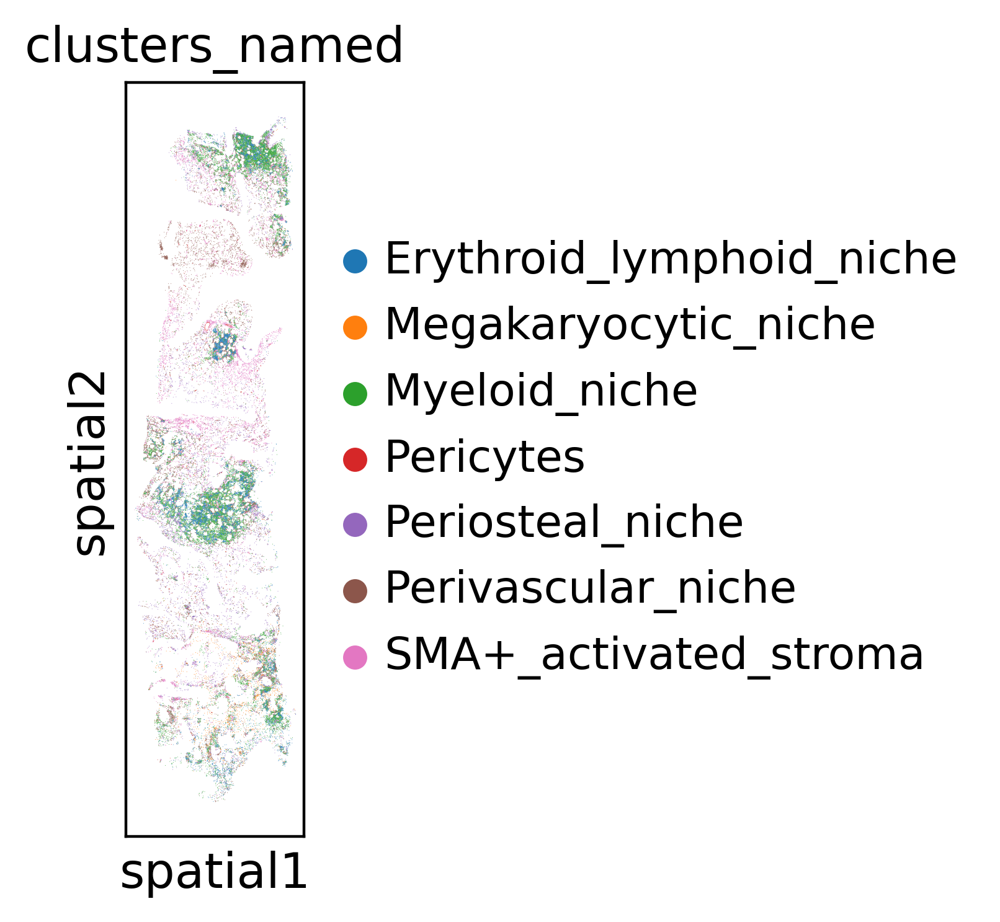

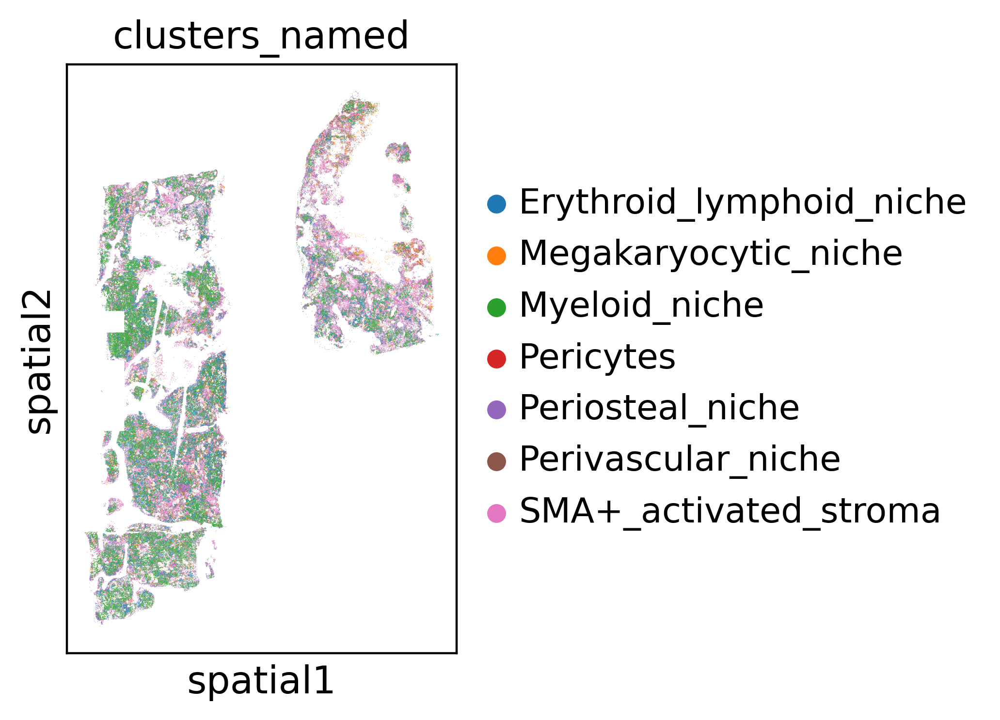

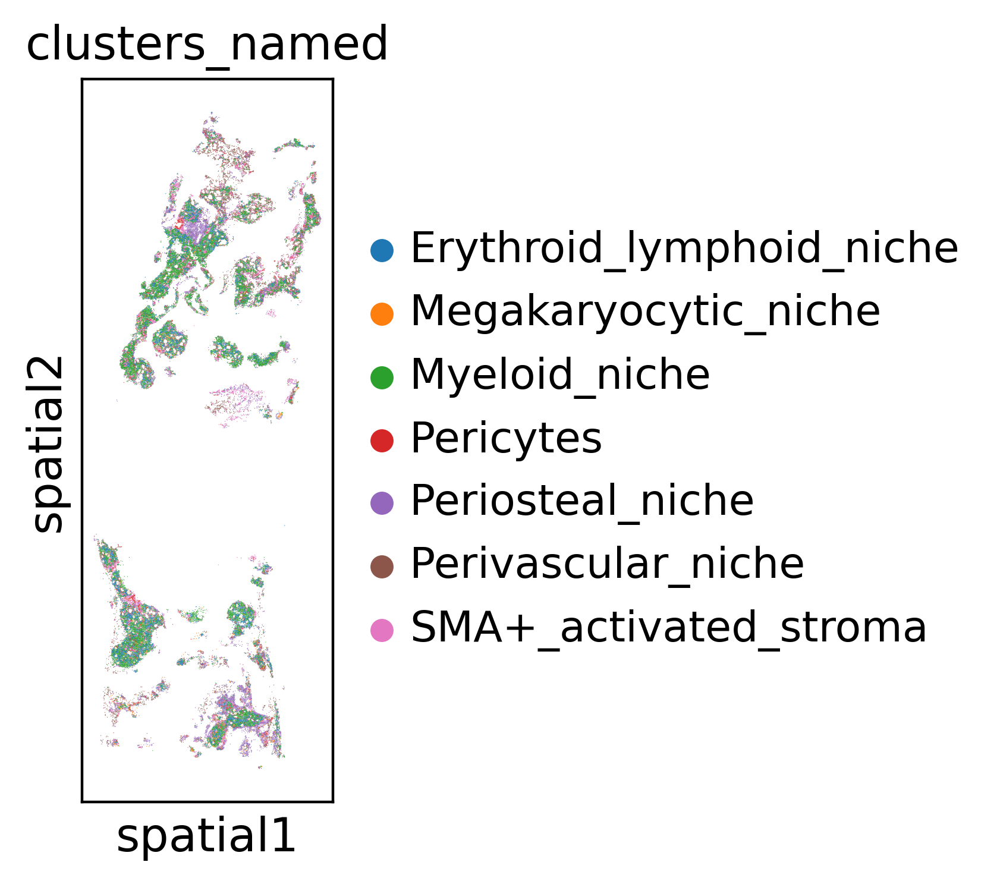

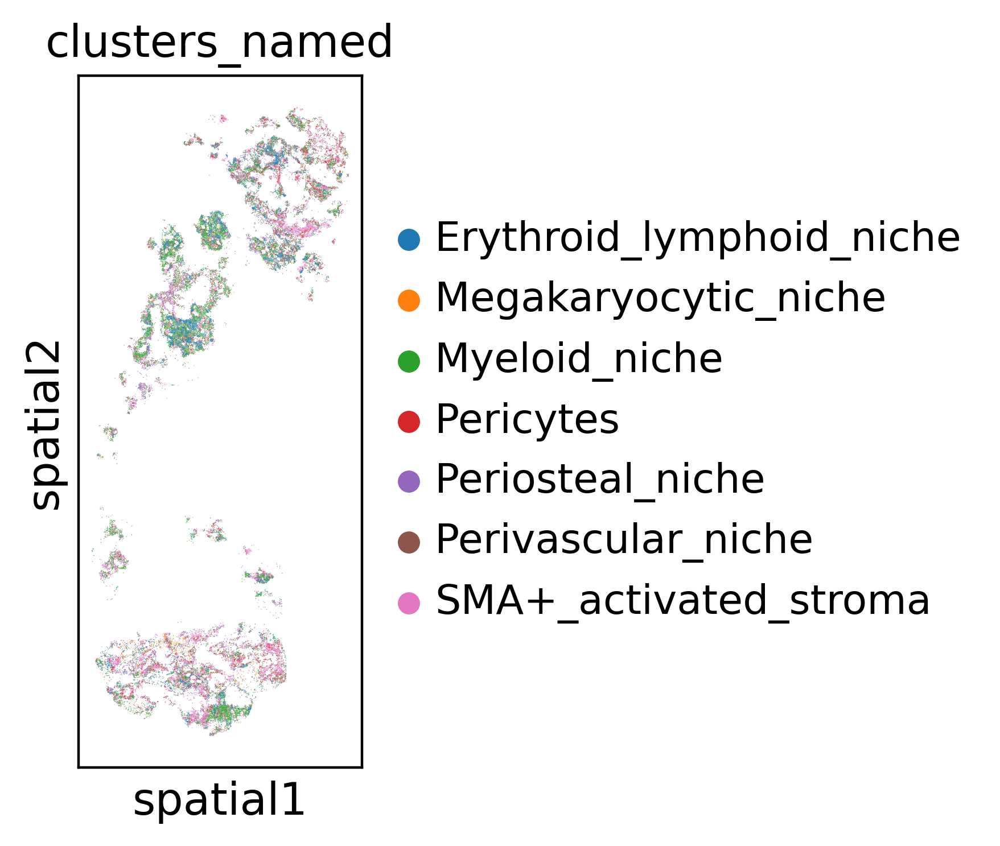

In [67]:
for smpl in list(anndata.obs['sample_reordered_name'].unique()):
    ad=anndata[anndata.obs['sample_reordered_name']==smpl].copy()
    #sc.pl.spatial(ad, color='clusters_named', spot_size = 20, use_raw=False,img_key=None, save='_'+smpl+'_clusters_r0.3.pdf')
    sc.pl.spatial(ad, color='clusters_named', spot_size = 20, use_raw=False,img_key=None, show=False)
    ax = plt.gca()
    ax.invert_yaxis()
    plt.savefig('./figures/'+smpl+'_clusters_r0.3.pdf',bbox_inches='tight')
    #plt.show()

In [68]:
#for smpl in list(anndata.obs['sample'].unique()):
#    ad=anndata[anndata.obs['sample']==smpl].copy()
#    sc.pl.spatial(ad, color=['Osteopontin.166', 'X127.CD61'], spot_size = 20, use_raw=False, save='_'+smpl+'_Spp1_CD61_spleen.pdf')